# Análise da popularidade do preside baseada em eventos

<p style='text-align: justify;'>
Para realizar está análise, será considerado os principais fatos dos anos de 2018, 2019 e 2020. Tais fatos serão agrupados por meses, e seram comparados com a popularidade do atual presidente antes e depois do acontecimento acontecimento dos fatos.
</p>

<p style='text-align: justify;'>
Para facilitar a análise, e torna-la menos maciva, e repetitiva, foram escolhidos os principais fatos ocorridos no ano, que julga-se poderem influenciar na popularidade do atual presidente. Sendo assim, pode ser que alguns meses de determinados nos, podem não ser expressados aqui pelos seguintes fatos:
</p>
    
- Não aconteceu nada no mês;
- Não aconteceu nada no mês que possa influênciar na política (jogos olimpicos);
- Julgamos que tal acontecimento possa não ter um impacto relevante para ser considerado.

<p style='text-align: justify;'>
É preciso destacar também, que alguns fatos de meses diferentes podem ser agrupadas para realizar a análise, simplesmente pelo fato de estarem interligados, por acontecerem em um curto intervalo de tempo, ou para diminuir o escopo da análise.
</p>

### Fatos que serão analisados

<p style='text-align: justify;'>
Os fatos que seram analisados estão listados logo abaixo, com suas respectivas datas, separados por anos. Os títulos dos eventos abaixo, foram retirados das referencias, que estão listadas mais a frente.
</p>
    
#### Eventos de 2018

* [GRUPO - 1/18]
    * [08/07/18] - Lua Llivre? Lula Preso?
    * [31/08/18] - Início oficial da campanha eleitoral
    * [06/09/18] - Ataque a bolsonaro: afetou a disputa presidencial?
* [GRUPO - 2/18]
    * [14/11/18] - Mais médicos: a ação de cuba de retirar médicos do país
    * [19/12/18] - O ex-assessor de flávio bolsonaro
    
#### Eventos de 2019

* [GRUPO  - 1/19]
    * [01/19] - CASO QUEIROZ E FLÁVIO BOLSONARO
    * [01/19] - JEAN WYLLYS RENUNCIA CARGO
    * [02/19] - FLAVIO BOLSONARO E MILÍCIAS

#### Eventos de 2020

* [GRUPO  - 1/20]
    * [01/20] - Desmonte de um Super Ministério?
    * [01/20] - O coronavirus. Uma nova pandemia?
    
* [GRUPO  - 2/20]
    * [15/03/20] - Manifestação de apoio a Bolsonaro
    * [03/20] - Quarentena Nacional e a política dos governadores

* [GRUPO  - 3/20]
    * [16/04/20] - O cabo de guerra entre Bolsonaro e Mandetta
    * [24/04/20] - A saída de Moro do governo
    * [02/05/20] - Depoimento de Sérgio Moro
    * [22/05/20] - Liberação do vídeo da Reunião Ministerial
    * [15/05/20] - Nova troca no Ministério da Saúde

### Fontes

POLITIZE!. In: RETROSPECTIVAS: Conteúdos que relembram acontecimentos marcantes da política nacional e internacional.. Politize!, [20--]. Disponível em: https://www.politize.com.br/temas-politize/retrospectivas/. Acesso em: 10 out. 2020.

- Possíveis citações aceitas: Politize!... ([20--]) ou (POLITIZE!..., [20--])

GONÇALVES, Pollyanna; DORES, Wellington; BENEVENUTO, Fabricio. PANAS-t: Uma escala psicométrica para medição de sentimentos no Twitter. In: Anais do I Brazilian Workshop on Social Network Analysis and Mining. SBC, 2012.

- Foramto bibiTeX: @inproceedings{gonccalves2012panas,
  title={PANAS-t: Uma escala psicom{\'e}trica para medi{\c{c}}{\~a}o de sentimentos no Twitter},
  author={Gon{\c{c}}alves, Pollyanna and Dores, Wellington and Benevenuto, Fabricio},
  booktitle={Anais do I Brazilian Workshop on Social Network Analysis and Mining},
  year={2012},
  organization={SBC}}

### Iniciado a análise dos dados

- Inicializando a bibliotecas que seram utilizadas
- Carregando o arquivo com os posts do Bolsonaro para análise dos dados.

### Preparação dos dados

Importando bibliotecas necessarias para realizar a análise.

In [1]:
import pandas as pd # biblioteca para análise de dados em python
import matplotlib.pyplot as plt # biblioteca para plotar gráficos
import seaborn as sns #biblioteca para auxilio na visualização dos dados
import json
import csv
import numpy as np
import os
import re

from IPython.display import display
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
%matplotlib inline

from textblob import TextBlob
from textblob import TextBlob
from textblob.classifiers import NaiveBayesClassifier

import nltk
from nltk import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

import spacy

nlp = spacy.load("pt")

Lendo arquivo

In [32]:
posts = pd.read_csv('posts_details_bolsonaro.tsv', delimiter='\t',encoding='utf-8') # le o arquivo - separador é o \t
posts.columns = ['id', 'data', 'likes', 'angry', 'shares'] #muda como o lable da coluna é exibido

Lendo arquivo com detalhes dos posts de bolsonaro

In [33]:
posts_comments = pd.read_csv('posts_details_comments_bolsonaro.tsv', delimiter='\t',encoding='utf-8') # le o arquivo - separador é o \t
posts_comments.columns = ['id', 'data', 'mensagem', 'likes', 'angry', 'shares'] #muda como o lable da coluna é exibido

### Análise da popularidade dos twittes do bolsonaro

#### Aqui iremos fazer um tipo de análise sentimental

<p style='text-align: justify;'>
A análise sentimental irá nos ajudar a conhecer melhor a rede de seguidores do bolsonaro. Por exemplo: se a porcentagem de twitter positivos dele for muito alta, e por um acaso por causa de alguma postagem, ou algum evento que aconteceu, o mesmo receber muita negatividade, isso pode significa que as própias pessoas que os segue não concordam com a atitude dele naquele momento, ou estão deixando de ser simpático as causas que o mesmo apioia.
</p>

Verificando o post de bolsonaro com mais likes

In [4]:
posts_like_max = np.max(posts["likes"])
posts_text_max = posts[posts_comments["likes"] == posts_like_max].index[0]

print("############ Dados do Jair ############")
print('\n')
print("O tweet com mais curtidas é: \n{}".format(posts_comments['mensagem'][posts_text_max]))
print("\n")
print("A quantidade de curtidas é: {} \n".format(posts_like_max))
print('\n')

############ Dados do Jair ############


O tweet com mais curtidas é: 
- 10.000.000 de curtidas no Facebook. \n- Obrigado pelo apoio e confian\u00e7a.\n- Boa noite a todos.


A quantidade de curtidas é: 501402 





In [5]:
# http://www.linguateca.pt/Repositorio/ReLi/ReLi-Lex.rar
base_path = 'ReLi-Lex'
train = []
wordsPT = []
wordsPT_sentiments = []

files = [os.path.join(base_path, f) for f in os.listdir(base_path)]

for file in files:
    t = 1 if '_Positivos' in file else -1
    with open(file, 'r', encoding="ISO-8859-1") as content_file:
        content = content_file.read()
        all = re.findall('\[.*?\]',content)
        for w in all:
            wordsPT.append((w[1:-1]))
            wordsPT_sentiments.append(t)
            train.append((w[1:-1], t))

cl = NaiveBayesClassifier(train)

In [6]:
def clean_tweet(tweet):
    return ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ", str(tweet)).split())

In [7]:
def sentiment(tweet):
    
    polarity = 0
    
    #blob = TextBlob(tweet, classifier=cl)
    blob = TextBlob(clean_tweet(tweet), classifier=cl) #Clean Tweets
    
    for s in blob.sentences:
        polarity = s.classify() + polarity
    
    if polarity > 0:
        return 1
    elif polarity < 0:
        return -1
    else:
        return 0

In [8]:
posts_comments_blob = np.array([ sentiment(tweet) for tweet in posts_comments['mensagem']])

In [9]:
posts_comments_pos_tweets = [ tweet for index, tweet in enumerate(posts_comments['mensagem']) if posts_comments_blob[index] > 0]
posts_comments_neg_tweets = [ tweet for index, tweet in enumerate(posts_comments['mensagem']) if posts_comments_blob[index] < 0]

In [10]:
print("#################### Jair Bolsonaro ####################")
print("Porcentagem de Tweets Positivos: {}%".format(len(posts_comments_pos_tweets)*100/len(posts_comments['mensagem'])))
print("Porcentagem de Tweets Negativos: {}%".format(len(posts_comments_neg_tweets)*100/len(posts_comments['mensagem'])))

#################### Jair Bolsonaro ####################
Porcentagem de Tweets Positivos: 93.08831596269884%
Porcentagem de Tweets Negativos: 6.555128908392759%


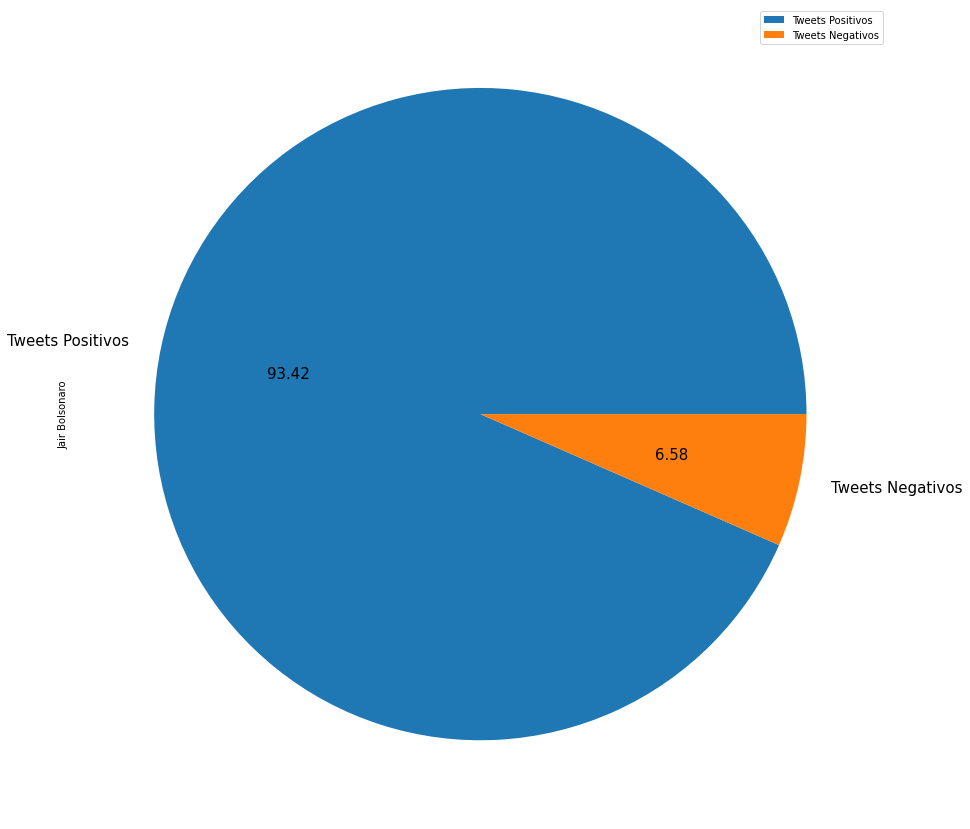

In [11]:
df = pd.DataFrame({'Jair Bolsonaro': [len(posts_comments_pos_tweets), len(posts_comments_neg_tweets)]},
                  index=['Tweets Positivos', 'Tweets Negativos'])
plot = df.plot.pie(subplots=True,autopct='%.2f',fontsize=15, figsize=(15, 15))

In [12]:
#!pip install plotly
import plotly.express as px
import plotly.graph_objects as go

fig1 = go.Figure([go.Scatter(x=posts_comments['data'], y=posts_comments['angry'], name='Reações Negativas')])
fig1.show()

fig1 = go.Figure([go.Scatter(x=posts_comments['data'], y=posts_comments['likes'], name = 'Reações Positivas')])
fig1.show()


columns_two = ['angry', 'likes']
names = {'angry': 'Reações Negativas',
         'likes': 'Reações Positivas'}

fig = go.Figure([{
    'x': posts_comments['data'],
    'y': posts_comments[col],
    'name': names[col]
}  for col in columns_two])
fig.show(renderer='iframe')

In [13]:
df_before = posts_comments[posts_comments['data'] < '2018-09-01'].copy()
df_before.head()

,id,data,mensagem,likes,angry,shares
1214,211857482296579_671829229862929,2018-08-31T18:22:36+0000,- Chegada no Aeroporto de Porto Velho - Rond\u...,59801,259,33583
1215,211857482296579_676723089360200,2018-08-31T11:13:19+0000,"- Aeroporto Salgado Filho. \n- Porto Alegre, 2...",22673,18,20603
1216,211857482296579_497399267332270,2018-08-31T10:02:53+0000,- Obrigado pela considera\u00e7\u00e3o mulhere...,25632,15,8068
1217,211857482296579_228297974509051,2018-08-30T14:40:59+0000,- a invers\u00e3o de valores e o politicamente...,20461,598,12786
1218,211857482296579_903442709866212,2018-08-30T12:01:18+0000,"- Jornal O Globo de hoje, 30/08/2018, diz que...",57960,2823,57047


In [14]:
df_after = posts_comments[posts_comments['data'] >= '2018-09-01'].copy()
df_after.tail()

,id,data,mensagem,likes,angry,shares
1209,211857482296579_1850661045013730,2018-09-03T08:14:18+0000,"- Relembrando, um bate papo bacana com a jorna...",32147,28,8863
1210,211857482296579_2053595561347024,2018-09-01T22:49:50+0000,"- Em Rio Branco/AC, ao lado de \u00edndios, um...",23555,20,5780
1211,211857482296579_337520606990975,2018-09-01T19:07:55+0000,- 01 de setembro de 2018 - Chegada no Aeroport...,21891,13,7194
1212,211857482296579_1015053668695757,2018-09-01T12:10:41+0000,- Entrevista onde tratamos de assuntos referen...,25899,26,10308
1213,211857482296579_2135117230148766,2018-09-01T02:51:09+0000,"- S\u00e1bado, 01/setembro \u00e1s 12hs, pous...",21076,16,2853


In [15]:
def clean_df(df_clean):
    remove_names = False # if True, assumes you have a nomes.txt file with common brazilian names in your current dir
    remove_usernames = False
    
    # Copy the original text for later metadata
    df_clean['original_mensagem'] = df_clean['mensagem'].copy
    
    # Lower case
    df_clean['mensagem'] = df_clean['mensagem'].apply(lambda x: " ".join(str(x).lower() for x in str(x).split()))
    
    # Remove usernames
    if remove_usernames:
         df_clean['mensagem'] = df_clean['mensagem'].str.replace('@[^\s]+', "")
            
    # Remove links
    df_clean['mensagem'] = df_clean['mensagem'].str.replace('https?:\/\/.*[\r\n]*', '')
    
    # Remove punctuation
    df_clean['mensagem'] = df_clean['mensagem'].str.replace('[^\w\s]', '')
    
    # Remove stopwords
    from nltk.corpus import stopwords
    stop = stopwords.words('portuguese')
    df_clean['mensagem'] = df_clean['mensagem'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

    # Remove common brazilian names
    if remove_names:
        nomes = pd.read_csv('nomes.txt', encoding='latin', header=None)
        lista_nomes = (nomes[0].str.lower()).tolist()
        df_clean['text'] = df_clean['text'].apply(lambda x: " ".join(
            x for x in x.split() if x not in lista_nomes))

    # Remove numbers
    df_clean['mensagem'] = df_clean['mensagem'].str.replace(
        '\d+', '')

    # Remove words with 1-3 chars
    df_clean['mensagem'] = df_clean['mensagem'].str.replace(r'\b(\w{1,3})\b', '')

    # Replace accents and ç
    df_clean.mensagem = df_clean.mensagem.str.normalize('NFKD')\
        .str.encode('ascii', errors='ignore')\
        .str.decode('utf-8')
    
    return df_clean

In [16]:
df_before = clean_df(df_before)
df_before.head()

,id,data,mensagem,likes,angry,shares,original_mensagem
1214,211857482296579_671829229862929,2018-08-31T18:22:36+0000,chegada aeroporto porto velho rondufniann link...,59801,259,33583,<bound method NDFrame.copy of 1214 chegada ...
1215,211857482296579_676723089360200,2018-08-31T11:13:19+0000,aeroporto salgado filho porto alegre agoston ...,22673,18,20603,<bound method NDFrame.copy of 1214 chegada ...
1216,211857482296579_497399267332270,2018-08-31T10:02:53+0000,obrigado consideraueueo mulheres gaufachas udd...,25632,15,8068,<bound method NDFrame.copy of 1214 chegada ...
1217,211857482296579_228297974509051,2018-08-30T14:40:59+0000,inversueo valores politicamente correto implem...,20461,598,12786,<bound method NDFrame.copy of 1214 chegada ...
1218,211857482296579_903442709866212,2018-08-30T12:01:18+0000,jornal globo hoje informaueueo sobre livro s...,57960,2823,57047,<bound method NDFrame.copy of 1214 chegada ...


In [17]:
df_after = clean_df(df_after)
df_after.head()

,id,data,mensagem,likes,angry,shares,original_mensagem
0,211857482296579_1826486634166981,2020-03-22T18:47:55+0000,agora vueddeoconferueancia presidente jair bol...,129465,112,23151,<bound method NDFrame.copy of 0 agora vu...
1,211857482296579_1826339070848404,2020-03-22T16:30:39+0000,inscriueufes seleueueo profissionais atuaueue...,52238,43,5703,<bound method NDFrame.copy of 0 agora vu...
2,211857482296579_1826130007535977,2020-03-22T13:37:26+0000,ministuerio saufade ministro mandetta reuniueo...,97986,65,11818,<bound method NDFrame.copy of 0 agora vu...
3,211857482296579_1825937284221916,2020-03-22T11:07:01+0000,governo federal distribui milhufes testes ruep...,165539,68,39284,<bound method NDFrame.copy of 0 agora vu...
4,211857482296579_1825422034273441,2020-03-22T02:06:48+0000,chama precauueueo medicamento barato caso ven...,162513,509,27236,<bound method NDFrame.copy of 0 agora vu...


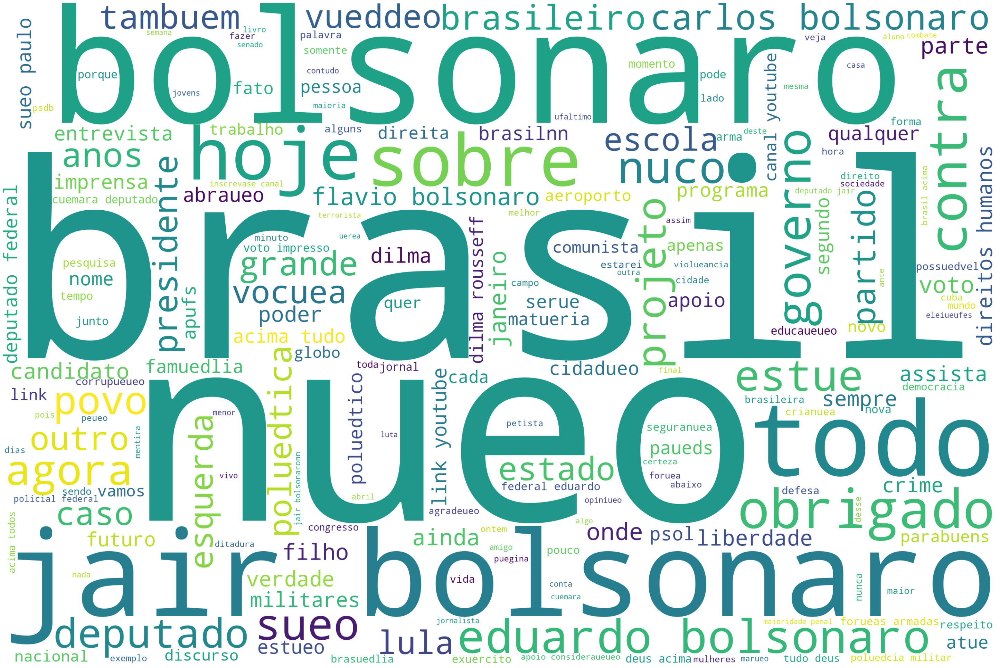

In [18]:
text = " ".join(review for review in df_before.mensagem)
wordcloud = WordCloud(
    width=3000,
    height=2000,
    background_color='white').generate(text)
fig = plt.figure(
    figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

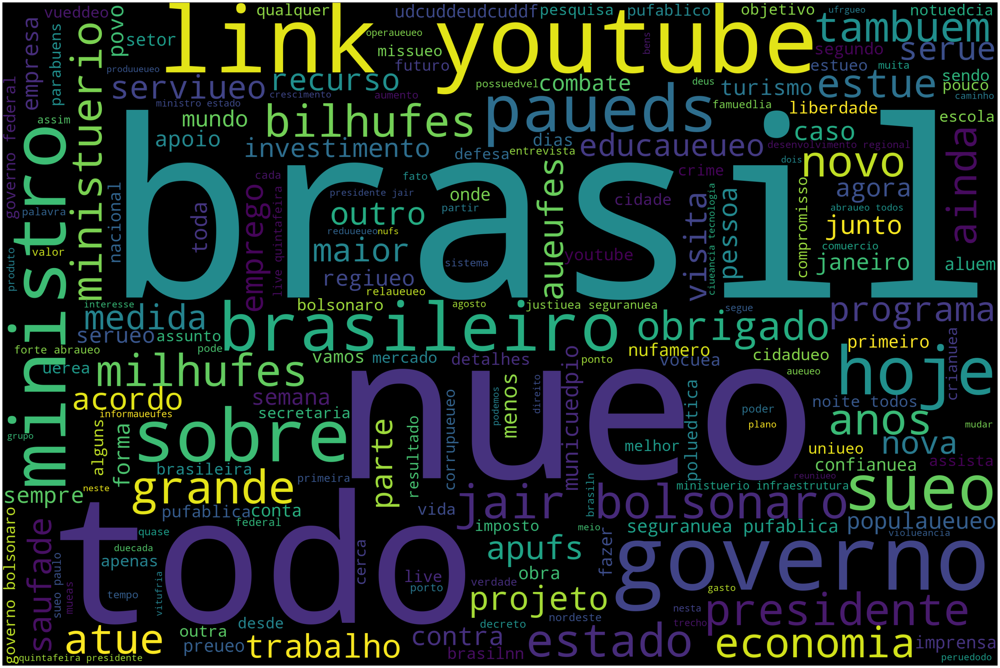

In [19]:
text = " ".join(review for review in df_after.mensagem)
wordcloud = WordCloud(
    width=3000,
    height=2000,
    background_color='black').generate(text)
fig = plt.figure(
    figsize=(40, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Eventos de 2018

    [GRUPO - 1/18]
        [08/07/18] - Lua Llivre? Lula Preso?
        [31/08/18] - Início oficial da campanha eleitoral
        [06/09/18] - Ataque a bolsonaro: afetou a disputa presidencial?

In [20]:
df_eventos_2018_grupo1 = posts_comments[posts_comments['data'] < '2018-09-30'].copy()
df_eventos_2018_grupo1 = df_eventos_2018_grupo1[df_eventos_2018_grupo1['data'] > '2018-07-01'].copy()
df_eventos_2018_grupo1_after = posts_comments[posts_comments['data'] >= '2018-09-31'].copy()
df_eventos_2018_grupo1_before = posts_comments[posts_comments['data'] < '2018-07-01'].copy()

In [21]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1['data'], y=df_eventos_2018_grupo1['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1_after['data'], y=df_eventos_2018_grupo1_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1_before['data'], y=df_eventos_2018_grupo1_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1['data'], y=df_eventos_2018_grupo1['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1_after['data'], y=df_eventos_2018_grupo1_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo1_before['data'], y=df_eventos_2018_grupo1_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()

Eventos de 2018

    [GRUPO - 2/18]
        [14/11/18] - Mais médicos: a ação de cuba de retirar médicos do país
        [19/12/18] - O ex-assessor de flávio bolsonaro

In [22]:
df_eventos_2018_grupo2 = posts_comments[posts_comments['data'] < '2018-12-31'].copy()
df_eventos_2018_grupo2 = df_eventos_2018_grupo2[df_eventos_2018_grupo2['data'] > '2018-11-01'].copy()
df_eventos_2018_grupo2_after = posts_comments[posts_comments['data'] > '2018-12-31'].copy()
df_eventos_2018_grupo2_before = posts_comments[posts_comments['data'] < '2018-11-01'].copy()

In [23]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2['data'], y=df_eventos_2018_grupo2['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2_after['data'], y=df_eventos_2018_grupo2_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2_before['data'], y=df_eventos_2018_grupo2_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2['data'], y=df_eventos_2018_grupo2['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2_after['data'], y=df_eventos_2018_grupo2_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2018_grupo2_before['data'], y=df_eventos_2018_grupo2_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()

Eventos de 2019

    [GRUPO - 1/19]
        [01/19] - CASO QUEIROZ E FLÁVIO BOLSONARO
        [01/19] - JEAN WYLLYS RENUNCIA CARGO
        [02/19] - FLAVIO BOLSONARO E MILÍCIAS

In [24]:
df_eventos_2019_grupo1 = posts_comments[posts_comments['data'] < '2019-02-31'].copy()
df_eventos_2019_grupo1 = df_eventos_2019_grupo1[df_eventos_2019_grupo1['data'] > '2019-01-01'].copy()
df_eventos_2019_grupo1_after = posts_comments[posts_comments['data'] > '2019-02-31'].copy()
df_eventos_2019_grupo1_before = posts_comments[posts_comments['data'] < '2019-01-01'].copy()

In [25]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1['data'], y=df_eventos_2019_grupo1['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1_after['data'], y=df_eventos_2019_grupo1_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1_before['data'], y=df_eventos_2019_grupo1_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1['data'], y=df_eventos_2019_grupo1['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1_after['data'], y=df_eventos_2019_grupo1_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2019_grupo1_before['data'], y=df_eventos_2019_grupo1_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()

Eventos de 2020

    [GRUPO - 1/20]
        [01/20] - Desmonte de um Super Ministério?
        [01/20] - O coronavirus. Uma nova pandemia?

In [26]:
df_eventos_2020_grupo1 = posts_comments[posts_comments['data'] < '2020-01-31'].copy()
df_eventos_2020_grupo1 = df_eventos_2020_grupo1[df_eventos_2020_grupo1['data'] > '2019-01-01'].copy()
df_eventos_2020_grupo1_after = posts_comments[posts_comments['data'] > '2020-01-31'].copy()
df_eventos_2020_grupo1_before = posts_comments[posts_comments['data'] < '2019-01-01'].copy()

In [27]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1['data'], y=df_eventos_2020_grupo1['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1_after['data'], y=df_eventos_2020_grupo1_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1_before['data'], y=df_eventos_2020_grupo1_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1['data'], y=df_eventos_2020_grupo1['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1_after['data'], y=df_eventos_2020_grupo1_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo1_before['data'], y=df_eventos_2020_grupo1_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()

Eventos de 2020

    [GRUPO - 2/20]
        [15/03/20] - Manifestação de apoio a Bolsonaro
        [03/20] - Quarentena Nacional e a política dos governadores

In [28]:
df_eventos_2020_grupo2 = posts_comments[posts_comments['data'] < '2020-03-31'].copy()
df_eventos_2020_grupo2 = df_eventos_2020_grupo2[df_eventos_2020_grupo2['data'] > '2019-03-01'].copy()
df_eventos_2020_grupo2_after = posts_comments[posts_comments['data'] > '2020-03-31'].copy()
df_eventos_2020_grupo2_before = posts_comments[posts_comments['data'] < '2019-03-01'].copy()

In [29]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2['data'], y=df_eventos_2020_grupo2['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2_after['data'], y=df_eventos_2020_grupo2_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2_before['data'], y=df_eventos_2020_grupo2_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2['data'], y=df_eventos_2020_grupo2['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2_after['data'], y=df_eventos_2020_grupo2_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo2_before['data'], y=df_eventos_2020_grupo2_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()

Eventos de 2020

    [GRUPO - 3/20]
        [16/04/20] - O cabo de guerra entre Bolsonaro e Mandetta
        [24/04/20] - A saída de Moro do governo
        [02/05/20] - Depoimento de Sérgio Moro
        [22/05/20] - Liberação do vídeo da Reunião Ministerial
        [15/05/20] - Nova troca no Ministério da Saúde

In [30]:
df_eventos_2020_grupo3 = posts_comments[posts_comments['data'] < '2020-05-31'].copy()
df_eventos_2020_grupo3 = df_eventos_2020_grupo2[df_eventos_2020_grupo2['data'] > '2019-04-01'].copy()
df_eventos_2020_grupo3_after = posts_comments[posts_comments['data'] > '2020-05-31'].copy()
df_eventos_2020_grupo3_before = posts_comments[posts_comments['data'] < '2019-04-01'].copy()

In [31]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3['data'], y=df_eventos_2020_grupo3['likes'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3_after['data'], y=df_eventos_2020_grupo3_after['likes'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3_before['data'], y=df_eventos_2020_grupo3_before['likes'], name="Antes", mode='lines'))

fig.update_layout(title='Reações positivas Antes, Durante e Apôs os eventos',)

fig.show()

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3['data'], y=df_eventos_2020_grupo3['angry'], name="Durante", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3_after['data'], y=df_eventos_2020_grupo3_after['angry'], name="Depois", mode='lines'))
fig.add_trace(go.Scatter(x=df_eventos_2020_grupo3_before['data'], y=df_eventos_2020_grupo3_before['angry'], name="Antes", mode='lines'))

fig.update_layout(title='Reações negativas Antes, Durante e Apôs os eventos',)

fig.show()